<a href="https://colab.research.google.com/github/gizdatalab/SGD_11_Tracking_Colombia/blob/main/OSM_Overpass_API.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title Install packages { display-mode: "form" }
%%capture
!pip install geopandas
!pip install folium
!pip install geemap

# Data Experiment DANE/GIZ Knowledge Transfer #1 OSM

this is the first appointment to share the knowledge, about SDG tracking using geospital data, we have gained during our collaboration.


# Introduction / Introducción

This is an Overpass API / Open Street Map (OSM) demonstration notebook.  In our project we use the data from OSM for the determination of streets and public places for the calculation of SDG 11.3.7. Furthermore, we use building footprints as training data for the classification of built-up areas.
  
  ----
    
Este es un cuaderno de demostración de Overpass API / Open Street Map (OSM).  En nuestro proyecto utilizamos los datos de OSM para la determinación de calles y lugares públicos para el cálculo del ODS 11.3.7. Además, utilizamos las huellas de los edificios como datos de entrenamiento para la clasificación de las zonas edificadas.



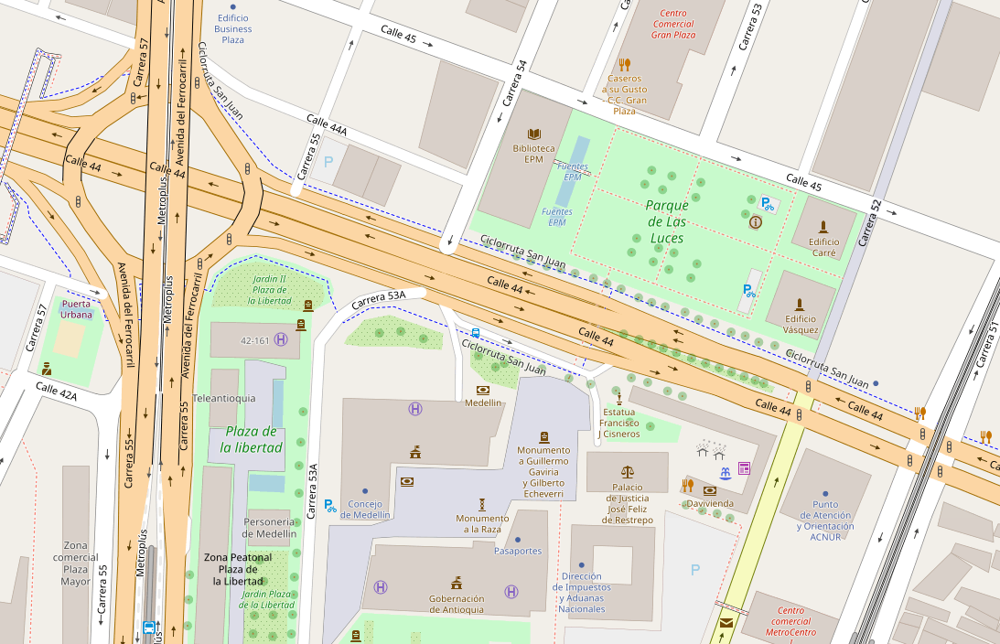

<p><img alt="Colaboratory logo" height="45px" src="/img/colab_favicon.ico" align="left" hspace="10px" vspace="0px"></p>

<h1>What is Colaboratory?</h1>

Colaboratory, or "Colab" for short, allows you to write and execute Python in your browser, with 
- Zero configuration required
- Free access to GPUs
- Easy sharing

Whether you're a **student**, a **data scientist** or an **AI researcher**, Colab can make your work easier. Watch [Introduction to Colab](https://www.youtube.com/watch?v=inN8seMm7UI) to learn more, or just get started below!  
  
  ---

  <p><img alt="Colaboratory logo" height="45px" src="/img/colab_favicon.ico" align="left" hspace="10px" vspace="0px"></p>

  <h1>¿Qué es Colaboratory?</h1>

Colaboratory, o "Colab" para abreviar, le permite escribir y ejecutar Python en su navegador, con 
- Ninguna configuración requerida
- Acceso gratuito a las GPUs
- Fácil de compartir

Tanto si eres un **estudiante**, un **científico de datos** o un **investigador de la IA**, Colab puede facilitar tu trabajo. Mira [Introducción a Colab](https://www.youtube.com/watch?v=inN8seMm7UI) para saber más, o simplemente empieza a continuación.



# Loading Data from OpenStreetMap with Python and the Overpass API / Carga de datos de OpenStreetMap con Python y el Overpass API

Overpass API is a read-only API that serves up custom selected parts of the OSM map data. It acts as a database over the web: the client sends a query to the API and gets back the data set that corresponds to the query.

Unlike the main API, which is optimized for editing, Overpass API is optimized for data consumers that need a few elements within a glimpse or up to roughly 10 million elements in some minutes, both selected by search criteria like e.g. location, type of objects, tag properties, proximity, or combinations of them. It acts as a database backend for various services.  
https://wiki.openstreetmap.org/wiki/Overpass_API    

  ---
  La API de Overpass es una API de sólo lectura que sirve partes seleccionadas personalizadas de los datos de los mapas de OSM. Actúa como una base de datos a través de la web: el cliente envía una consulta a la API y obtiene de vuelta el conjunto de datos que corresponde a la consulta.

A diferencia de la API principal, que está optimizada para la edición, la API de Overpass está optimizada para los consumidores de datos que necesitan unos pocos elementos dentro de un vistazo o hasta aproximadamente 10 millones de elementos en algunos minutos, ambos seleccionados por criterios de búsqueda como, por ejemplo, la ubicación, el tipo de objetos, las propiedades de la etiqueta, la proximidad, o combinaciones de ellos. Actúa como base de datos para varios servicios.

Additional resources: http://osmlab.github.io/learnoverpass/en/docs/filters/area/

## Example Hotel / Ejemplo de hotel

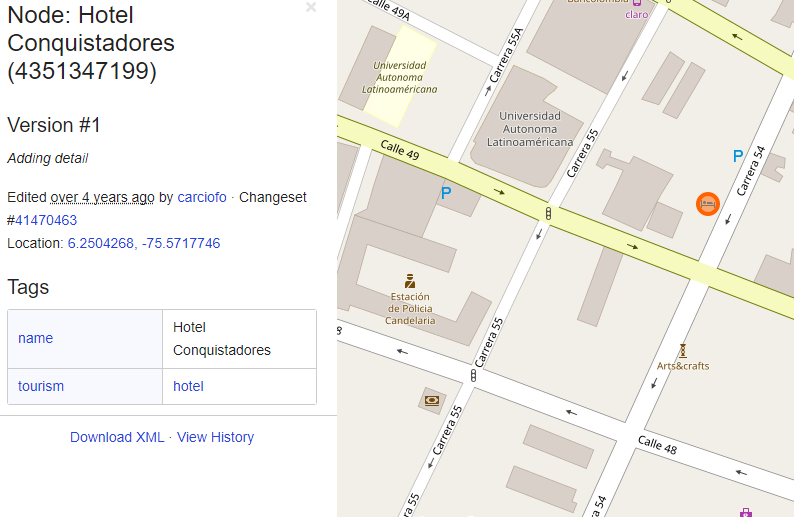

In [64]:
#load packages
from pandas.io.json import json_normalize
import requests

In [65]:
#define url to scrape from
url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL

The query is an sql-like syntax which you store as a textfile.   
It consists of four parts: 
### 1.  [out:json] 

*  specify the output format (json, alternative xml)
*  *especificar el formato de salida (json, xml alternativo)*


### 2. area["name"="Medellín"][admin_level=6] 
*  specify the the area (alternative bounding boxes)
*  Information on administrative levels can be found here: https://nominatim.openstreetmap.org/ui/search.html
*  *especificar el área (cuadros delimitadores alternativos)*
* *La información sobre los niveles administrativos se puede encontrar aquí:*
ttps://nominatim.openstreetmap.org/ui/search.html



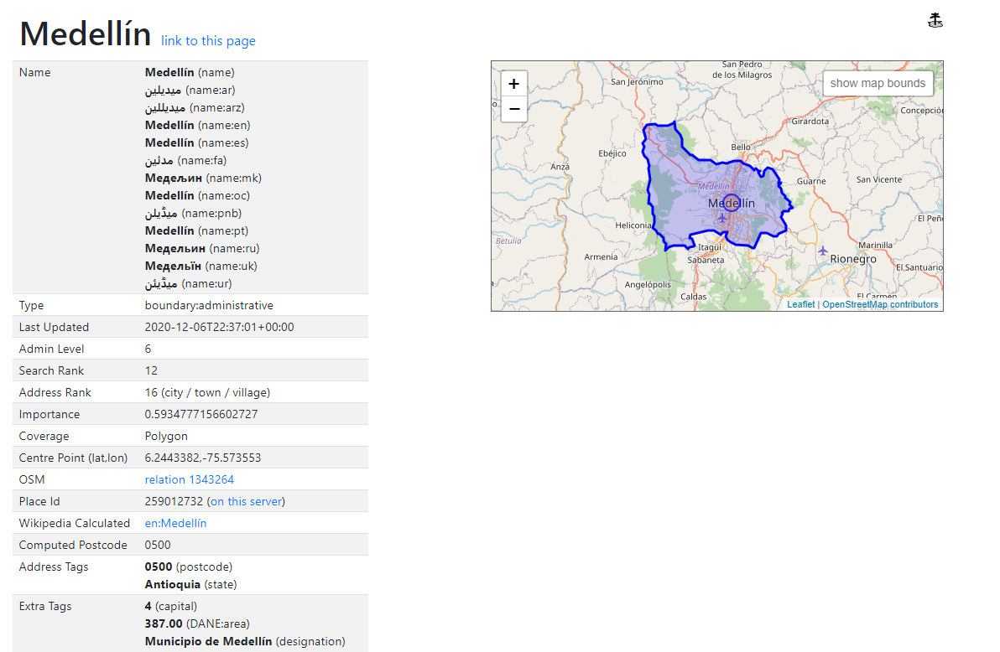

### 3. node["tourism"="hotel"]
*  every Tag can be queried (could also query for the hotel name)
*  'se puede consultar cada etiqueta (también se puede consultar el nombre del hotel)  
  
  
There are three basic components in the OSM data model, which are nodes, ways and relations which all come with an id. Many of the elements come with tags which describe specific features represented as key-value pairs.  
 **Nodes** are points on the maps (in latitude and longitude) i.e. a hotel.  
A **way** on the other hand is a ordered list of nodes, which could correspond to a street or the outline of a house.  
The third element is a **relation** which is also an ordered list containing either nodes, ways or even other relations. It is used to model logical or geographic relationships between objects. This can be used for example for large structures of multiple polygons to describe i.e. buildings.  

---  
Hay tres componentes básicos en el modelo de datos de OSM, que son los nodos, los caminos y las relaciones que vienen todos con un id. Muchos de los elementos vienen con etiquetas que describen características específicas representadas como pares clave-valor.  
Los **nodos** son puntos en los mapas (en latitud y longitud), es decir, un hotel.  
Por otro lado, un **camino** es una lista ordenada de nodos, que puede corresponder a una calle o al contorno de una casa.  
El **tercer** elemento es una relación que también es una lista ordenada que contiene nodos, caminos o incluso otras relaciones. Se utiliza para modelar relaciones lógicas o geográficas entre objetos. Puede utilizarse, por ejemplo, para describir grandes estructuras de múltiples polígonos, por ejemplo, edificios.


### 4. out geom
*  output includes geometry
*  *la salida incluye la geometría*

### Query

In [68]:
query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    node["tourism"="hotel"](area) ;   
    out geom;
"""

In [69]:
r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df = json_normalize(data)  # create a DataFrame from the data
print(df.shape, '(number of hotel, number of atributes')


(58, 42) (number of hotel, number of atributes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


In [32]:
df[:2]

,type,id,lat,lon,tags.addr:street,tags.name,tags.operator,tags.source,tags.tourism,tags.addr:city,tags.addr:full,tags.internet_access,tags.internet_access:fee,tags.name:es,tags.phone,tags.rooms,tags.smoking,tags.stars,tags.website,tags.url,tags.wheelchair,tags.toilets:wheelchair,tags.wheelchair:description,tags.addr:housenumber,tags.payment:bitcoin,tags.addr:housename,tags.addr:postcode,tags.note,tags.contact:website,tags.opening_hours,tags.description,tags.email,tags.fax,tags.name:en,tags.building,tags.air_conditioning,tags.bar,tags.brand,tags.payment:cash,tags.payment:credit_cards,tags.brand:wikidata,tags.brand:wikipedia
0,node,358110291,6.252395,-75.567272,Calle 53,Hotel Nutibara,Hotel Nutibara,Kaart Ground Survey 2018,hotel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node,416641976,6.208739,-75.559449,NaN,Hotel Best Westren Sky Medellín,Sky Plus Medellín S.A.S,NaN,hotel,Medellín,Cr 30 9A-47,yes,no,Best Western Sky Hotel Medellin,4445546,34,separated,4,http://www.skymedellin.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
#@title Helper functions { display-mode: "form" }
from shapely.geometry import shape, Point, Polygon
import geopandas as gpd
import pandas as pd

def to_point(x):
    '''
    To point geometry
    '''
    return Point(x['lon'],x['lat'])


def to_geom(x):
    '''
    Change the format of the geometry of the OSM extracted data to a Polygon
    '''
    if len(x)>2:
        y = Polygon([(pair['lon'],pair['lat']) for pair in x])
    else:
        y = Point(x[0]['lat'],x[0]['lon'])
    return y

def to_gdf(df):
    '''
    Apply the transformation to the whole dataset and calculate areasize
    '''
    if 'geometry' in df.columns:
        df['geometry'] = df['geometry'].apply(lambda x: shape(to_geom(x)))
    else:
        df['geometry'] = df[['lat','lon']].apply(to_point,axis=1)

    gdf = gpd.GeoDataFrame(df, geometry=df.geometry)

    gdf = gdf.set_crs(epsg=4326)#, inplace=True) 4326 3857
    gdf['area'] = gdf['geometry'].area * 100000
    return gdf


def explode(indata):
    '''
    Some items a stored as multipolygon (containing more than one polygon in the geometry) and need to treat them differently by itterating through the polygones. 
    '''
    outdf = pd.DataFrame(columns=indata.columns)
    outdf['geometry'] = None
    for idx, row in indata.iterrows():
        for pol in row['members']:
            row['geometry'] = to_geom(pol['geometry'])
            outdf = outdf.append(row,ignore_index=True)
            
            #print(idx,pol['geometry'])
    gdf_out = gpd.GeoDataFrame(outdf, geometry=outdf.geometry)
    gdf_out = gdf_out.set_crs(epsg=4326)#, inplace=True) 4326 3857
    gdf_out['area'] = gdf_out['geometry'].area * 100000
    return gdf_out


In [ ]:
# use helper  function to convert to geopandas dataframe
gdf = to_gdf(df)


In [62]:
import folium

style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}

m = folium.Map([6.25,-75.57], zoom_start=15)
folium.GeoJson(gdf,style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields=['tags.name','tags.tourism','tags.stars','tags.website','area'])).add_to(m)

m

# Extract Public Spaces from OSM / Extraer espacios públicos de OSM 

  




## Landuse filter / Uso del suelo





Landuse | frequency
--- | ---
residential         |       1909  
forest               |       274  
grass                |       215  
farmland             |        70  
industrial           |        56  
garages              |        44  
recreation_ground    |        43  
orchard              |        37  
commercial           |        32  
meadow               |        21  
retail               |        13  
greenfield           |        12  
religious            |        11  
construction         |        10  

In [ ]:
from pandas.io.json import json_normalize
import requests

url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL

query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    way["landuse"~"^(forest|grass|water|recreation_ground)$"](area) ;   
    out geom;
"""
r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_lu = json_normalize(data)  # create a DataFrame from the data
print(df_lu.shape)
df_lu[:3]

(547, 27)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  


,type,id,nodes,geometry,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.landuse,tags.leisure,tags.name,tags.area,tags.note,tags.sport,tags.leaf_type,tags.official_name,tags.source,tags.fixme,tags.natural,tags.historic,tags.tourism,tags.type,tags.amenity,tags.leaf_cycle,tags.golf,tags.barrier,tags.access
0,way,28565409,"[313792038, 313792039, 3682491209, 3682491210,...","[{'lat': 6.2687547, 'lon': -75.5869643}, {'lat...",6.260035,-75.586964,6.272705,-75.576463,forest,park,Ecoparque Cerro El Volador,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,29640187,"[326248201, 5973444126, 326248206, 326248209, ...","[{'lat': 6.2443574, 'lon': -75.612896}, {'lat'...",6.244128,-75.612896,6.244600,-75.612380,forest,NaN,NaN,forest,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,30011584,"[330380087, 330380088, 330380089, 330380090, 3...","[{'lat': 6.242276, 'lon': -75.6136013}, {'lat'...",6.241315,-75.613601,6.242301,-75.613139,forest,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
gdf_lu = to_gdf(df_lu)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [ ]:
gdf_lu['building'] = False
gdf_lu['info1'] = gdf_lu['tags.landuse']
gdf_lu['info2'] = gdf_lu['tags.leisure']
gdf_lu['info3'] = gdf_lu['id']

Multipoly

In [ ]:
from pandas.io.json import json_normalize
import requests

url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL

query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    //way["landuse"~"^(forest|grass|water|recreation_ground)$"](area);
    relation["landuse"~"^(forest|grass|water|recreation_ground)$"](area) ;   
    out geom;
"""
r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_lu2 = json_normalize(data)  # create a DataFrame from the data
print(df_lu2.shape)
df_lu2[:3]

(8, 22)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  from ipykernel import kernelapp as app


,type,id,members,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.addr:city,tags.addr:housenumber,tags.addr:postcode,tags.addr:street,tags.landuse,tags.name,tags.phone,tags.sport,tags.type,tags.golf,tags.leaf_cycle,tags.leaf_type,tags.short_name,tags.designation,tags.source
0,relation,5423166,"[{'type': 'way', 'ref': 364743656, 'role': 'ou...",6.213992,-75.593614,6.216684,-75.591937,Medellín,1-200,050024,Carrera 70,recreation_ground,Unidad Deportiva María Luisa Calle,+57 (4) 341-0430,multi,multipolygon,NaN,NaN,NaN,NaN,NaN,NaN
1,relation,5489364,"[{'type': 'way', 'ref': 369426909, 'role': 'ou...",6.203569,-75.596671,6.208066,-75.591890,NaN,NaN,NaN,NaN,grass,NaN,NaN,NaN,multipolygon,fairway,NaN,NaN,NaN,NaN,NaN
2,relation,5490813,"[{'type': 'way', 'ref': 329328845, 'role': 'ou...",6.191492,-75.575365,6.194497,-75.572257,NaN,NaN,NaN,NaN,grass,NaN,NaN,NaN,multipolygon,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
gdf_lu2 = explode(df_lu2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [ ]:
gdf_lu2['building'] = False
gdf_lu2['info1'] = gdf_lu2['tags.landuse']
gdf_lu2['info2'] = gdf_lu2['tags.type']
gdf_lu2['info3'] = gdf_lu2['id']

In [ ]:
import folium

style0 = {'fillColor': '#ffffff', 'color': '#ffffff'}
style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}

m = folium.Map([6.2,-75.6], zoom_start=12)
folium.GeoJson(gdf_lu2,style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields=['tags.type','tags.landuse','id','type','area'])).add_to(m)

m

## Natural filter / Filtro natural

Landuse | frequency
--- | ---
wood     |    601
tree_row  |   169
water      |   68
sand        |  65
grassland    | 54
scrub         |51

In [ ]:
url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL

query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    way["natural"~"^(wood|tree_row|water|sand|grassland|scrub)$"](area) ;   
    out geom;
"""

r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_nat = json_normalize(data)  # create a DataFrame from the data
print(df_nat.shape)
df_nat[:3]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  if sys.path[0] == '':


(1008, 24)


,type,id,nodes,geometry,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.natural,tags.designation,tags.name,tags.water,tags.tidal,tags.wood,tags.leaf_type,tags.landuse,tags.amenity,tags.leisure,tags.golf,tags.leaf_cycle,tags.landcover,tags.intermittent,tags.opening_hours,tags.tourism
0,way,31016875,"[344882364, 3551142528, 3551142254, 344882365,...","[{'lat': 6.2956402, 'lon': -75.5028333}, {'lat...",6.290964,-75.507572,6.296125,-75.499001,water,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,31898314,"[357245655, 357245657, 357245659, 357245661, 3...","[{'lat': 6.2727589, 'lon': -75.6282018}, {'lat...",6.271581,-75.629806,6.273424,-75.627970,scrub,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,37017542,"[345243069, 345243064, 2633849443, 2633849450,...","[{'lat': 6.2534946, 'lon': -75.588795}, {'lat'...",6.253495,-75.590609,6.253730,-75.588795,water,Q. La Hueso,Quebrada La Hueso,river,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
gdf_nat = to_gdf(df_nat)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [ ]:
gdf_nat['building'] = False
gdf_nat['info1'] = gdf_nat['tags.natural']
gdf_nat['info2'] = gdf_nat['tags.leisure']
gdf_nat['info3'] = gdf_nat['id']

## Leisure filter / Filtro de tiempo libre

Landuse | frequency
--- | ---
park     |            720
pitch     |           621
swimming_pool|        299
garden        |        54
playground    |        53
sports_centre |        43
fitness_centre |       13
fitness_station |      11
track            |      8
common           |      6
stadium          |      5

In [ ]:
url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL

query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    way["leisure"~"^(park|garden|playground|sports_centre|fitness_station)$"](area) ;   
    out geom;
"""

r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_lei = json_normalize(data)  # create a DataFrame from the data
print(df_lei.shape)
df_lei[:3]

(881, 48)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  if sys.path[0] == '':


,type,id,nodes,geometry,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.landuse,tags.leisure,tags.name,tags.addr:city,tags.addr:street,tags.opening_hours,tags.addr:housenumber,tags.source,tags.building,tags.sport,tags.garden:type,tags.wikidata,tags.foot,tags.operator,tags.leaf_cycle,tags.leaf_type,tags.name:en,tags.name:es,tags.tourism,tags.website,tags.designation,tags.official_name,tags.alt_name,tags.wikipedia,tags.amenity,tags.natural,tags.man_made,tags.building:levels,tags.is_in,tags.addr:postcode,tags.description,tags.wheelchair,tags.denomination,tags.surface,tags.access,tags.phone,tags.dog,tags.playground:theme,tags.note,tags.opening_hours:covid19
0,way,28565409,"[313792038, 313792039, 3682491209, 3682491210,...","[{'lat': 6.2687547, 'lon': -75.5869643}, {'lat...",6.260035,-75.586964,6.272705,-75.576463,forest,park,Ecoparque Cerro El Volador,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,28565493,"[313792969, 5532356085, 313792970, 313792971, ...","[{'lat': 6.2107691, 'lon': -75.5711282}, {'lat...",6.209936,-75.571359,6.210769,-75.570590,NaN,park,Parque El Poblado,Medellín,Calle 10,24/7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,28565538,"[313793547, 7772781108, 7772781107, 7772781106...","[{'lat': 6.2088616, 'lon': -75.5672733}, {'lat...",6.208611,-75.568251,6.209174,-75.567251,NaN,park,Parque Lleras,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_lei['tags.building'].value_counts()

yes           14
public         2
University     1
university     1
Name: tags.building, dtype: int64

In [ ]:
gdf_lei = to_gdf(df_lei)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [ ]:
gdf_lei['building'] = gdf_lei['tags.building'].isna()==False
gdf_lei['info1'] = gdf_lei['tags.landuse']
gdf_lei['info2'] = gdf_lei['tags.leisure']
gdf_lei['info3'] = gdf_lei['id']

In [ ]:
import folium

style0 = {'fillColor': '#ffffff', 'color': '#ffffff'}
style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}

m = folium.Map([6.2,-75.6], zoom_start=12)
folium.GeoJson(gdf_lei[gdf_lei['tags.leisure']=='garden'],style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields=['tags.leisure','tags.natural','id','type','area'])).add_to(m)

m

##  Amenity filter / Filtro de amenidad

Landuse | frequency
--- | ---
parking      |       286
school        |      208
place_of_worship|    163
fuel       |          86
hospital    |         54
restaurant   |        51
clinic        |       49
college        |      48
community_centre|     46
library          |    40
university        |   27
social_facility    |  22
police              | 22
bank                 v21

In [ ]:
url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL

query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    way["amenity"~"^(school|hospital|college|community_centre|university)$"](area) ;   
    //way["amenity"](area) ;   
    out geom;
"""

r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_am = json_normalize(data)  # create a DataFrame from the data
print(df_am.shape)
df_am[:3]

(383, 54)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  del sys.path[0]


,type,id,nodes,geometry,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.amenity,tags.name,tags.addr:city,tags.addr:housenumber,tags.addr:street,tags.website,tags.building,tags.source,tags.operator,tags.addr:country,tags.addr:postcode,tags.addr:state,tags.emergency,tags.healthcare,tags.alt_name,tags.opening_hours,tags.building:flats,tags.building:levels,tags.phone,tags.healthcare:speciality,tags.denomination,tags.ele,tags.religion,tags.description,tags.fixme:name,tags.operator:type,tags.designation,tags.internet_access,tags.internet_access:fee,tags.short_name,tags.wheelchair,tags.landuse,tags.name:en,tags.barrier,tags.level,tags.layer,tags.height,tags.fence_type,tags.addr:unit,tags.email,tags.fixme,tags.area,tags.amenity_1,tags.fax,tags.opening_hours:covid19,tags.grades
0,way,32774024,"[369119497, 369119496, 369119505, 369119493, 3...","[{'lat': 6.2622341, 'lon': -75.5646189}, {'lat...",6.262191,-75.564619,6.262345,-75.564327,hospital,Pabellón de Salud Mental,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,33784057,"[386848864, 386848865, 4121140560, 2668667674,...","[{'lat': 6.203001, 'lon': -75.5785878}, {'lat'...",6.197201,-75.580077,6.203122,-75.577420,university,Universidad EAFIT,Medellín,7 sur - 50,Carrera 49,http://www.eafit.edu.co/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,44878015,"[568956621, 568956623, 568956624, 568956625, 5...","[{'lat': 6.2110259, 'lon': -75.5461919}, {'lat...",6.210924,-75.546192,6.211563,-75.545720,college,Seminario,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
gdf_am = to_gdf(df_am)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [ ]:
gdf_am['building'] = gdf_am['tags.building'].isna()==False
gdf_am['info1'] = gdf_am['tags.amenity']
gdf_am['info2'] = gdf_am['tags.name']
gdf_am['info3'] = gdf_am['id']

In [ ]:
import folium

style0 = {'fillColor': '#ffffff', 'color': '#ffffff'}
style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}

m = folium.Map([6.2,-75.6], zoom_start=12)
folium.GeoJson(gdf_am,style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields=['tags.amenity','tags.operator','id','type','area'])).add_to(m)

m

## Merge data / fusionar datos 

In [ ]:
var = ['id','geometry','info1','info2','building']

In [ ]:
print(gdf_lu.shape,gdf_lu2.shape,gdf_nat.shape,gdf_lei.shape,gdf_am.shape)

(547, 32) (22, 28) (1008, 28) (881, 53) (383, 59)


In [ ]:
gdf_nat[var][:2]

,id,geometry,info1,info2,building
0,31016875,"POLYGON ((-75.50283 6.29564, -75.50295 6.29571...",water,NaN,False
1,31898314,"POLYGON ((-75.62820 6.27276, -75.62845 6.27284...",scrub,NaN,False


In [ ]:
gdf_all = gdf_lu[var].append(gdf_lu2[var]).append(gdf_nat[var]).append(gdf_lei[var]).append(gdf_am[var])
print(gdf_all.shape)

(2841, 5)


In [ ]:
import folium

style0 = {'fillColor': '#ffffff', 'color': '#ffffff'}
style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}

m = folium.Map([6.2,-75.6], zoom_start=12)
folium.GeoJson(gdf_all,style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields= ['id','info1','info2'])).add_to(m)

m

In [ ]:
gdf_all = gdf_all.drop_duplicates()
print(gdf_all.shape)

(2831, 5)


In [ ]:
lt = [geo.type=='Polygon' for geo in gdf_all['geometry']]
gdf_all = gdf_all[lt] #[df['geometry'].type=='Polygon']
print(gdf_all.shape)

(2812, 5)


## Download data / descargar datos

In [ ]:
gdf_all[var].to_file(driver = 'ESRI Shapefile', filename= "medellin_public.shp")

In [ ]:
from google.colab import files
files.download('medellin_public.shp') 
files.download('medellin_public.shx') 
files.download('medellin_public.prj') 
files.download('medellin_public.cpg') 
files.download('medellin_public.dbf') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Extract streets from OSM / Extraer la calle de OSM 


In [70]:
from pandas.io.json import json_normalize
import requests

url = 'http://overpass-api.de/api/interpreter'  # Overpass API URL


query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    way["highway"~"^(residential|primary|secondary|tertiary)$"](area) ;
    out geom;
"""

r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_street = json_normalize(data)  # create a DataFrame from the data
print(df_street.shape)
df_street[:3]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


(16576, 106)


,type,id,nodes,geometry,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.highway,tags.name,tags.bus:lanes,tags.lanes,tags.oneway,tags.surface,tags.alt_name,tags.maxspeed,tags.mechanical,tags.junction,tags.lanes:backward,tags.lanes:forward,tags.maxspeed:type,tags.bridge,tags.layer,tags.turn:lanes,tags.description,tags.destination,tags.access,tags.turn:lanes:backward,tags.turn:lanes:forward,tags.cycleway:right,tags.cycleway:right:oneway,tags.note,tags.cycleway,tags.cycleway:left,tags.cycleway:left:oneway,tags.source:maxspeed,tags.destination:lanes,tags.is_in,tags.oneway:source:date,tags.sidewalk,...,tags.subway,tags.fixme,tags.noname,tags.destination:forward,tags.source:maxheight,tags.destination:backward,tags.motor_vehicle,tags.one,tags.motorroad,tags.width,tags.addr:street,tags.name:en,tags.old_name,tags.source,tags.noexit,tags.bridge:structure,tags.destination:street:backward,tags.int_name,tags.service,tags.addr:city,tags.addr:housenumber,tags.addr:postcode,tags.ele,tags.wheelchair,tags.mtb:scale,tags.smoothness,tags.placement,tags.busway,tags.loc_name,tags.in_service,tags.footway,tags.nat_name,tags.source:oneway,tags.minspeed,tags.handle,tags.busway:right,tags.check_date,tags.embankment,tags.divider,tags.opening_date
0,way,26546343,"[1410383169, 8317933902, 290960069, 8275610207...","[{'lat': 19.0681344, 'lon': -96.1589879}, {'la...",19.068134,-96.161439,19.069511,-96.158958,secondary,Calle Nicolás Bravo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,28136096,"[3547429578, 5532356111, 2752014881, 309026269...","[{'lat': 6.212465, 'lon': -75.5746775}, {'lat'...",6.211705,-75.574678,6.212465,-75.573359,secondary,Calle 10,yes|yes|permissive,3,yes,asphalt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,28136128,"[309026951, 309026949, 309026948, 309026947, 3...","[{'lat': 6.2063061, 'lon': -75.5715105}, {'lat...",6.206247,-75.571511,6.206803,-75.566388,residential,Calle 7,NaN,2,yes,asphalt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [71]:
gdf_street = to_gdf(df_street)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [76]:
lt = [geo.type=='Polygon' for geo in gdf_street['geometry']]
gdf_street = gdf_street[lt] #[df['geometry'].type=='Polygon']
print(gdf_street.shape)

(11881, 107)


In [77]:
import folium

style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}

m = folium.Map([6.25, -75.56], zoom_start=12)
#folium.GeoJson(m_aoi_ucu).add_to(m)
folium.GeoJson(gdf_street[gdf_street['area']<0.03][:2000],style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields=['tags.highway','tags.name','id','type','area'])).add_to(m)


m

In [ ]:
gdf_street['highway'] = gdf_street['tags.highway']
gdf_street = gdf_street[gdf_street['area']<0.03]

In [ ]:
gdf_all[var].to_file(driver = 'ESRI Shapefile', filename= "medellin_public.shp")

In [ ]:
from google.colab import files
files.download('medellin_public.shp') 
files.download('medellin_public.shx') 
files.download('medellin_public.prj') 
files.download('medellin_public.cpg') 
files.download('medellin_public.dbf') 

# Extract building footprints from OSM / Extraer las huellas de los edificios de OSM


In [80]:
query = f"""
    [out:json];
    area["name"="Medellín"][admin_level=6];
    way["building"](area) ;
    out geom;
"""
r = requests.get(url, params={'data': query})
data = r.json()['elements']  # read response as JSON and get the data
df_build = json_normalize(data)  # create a DataFrame from the data
print(df_build.shape)
df_build[:3]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  if __name__ == '__main__':


(52971, 155)


,type,id,nodes,geometry,bounds.minlat,bounds.minlon,bounds.maxlat,bounds.maxlon,tags.addr:city,tags.addr:housenumber,tags.addr:street,tags.amenity,tags.building,tags.denomination,tags.name,tags.religion,tags.alt_name,tags.source,tags.designation,tags.int_name,tags.leisure,tags.operator,tags.sport,tags.shop,tags.is_in,tags.website,tags.aeroway,tags.building:levels,tags.historic,tags.office,tags.old_name,tags.official_name,tags.tourism,tags.addr:postcode,tags.phone,tags.wheelchair,tags.emergency,tags.healthcare,tags.healthcare:speciality,tags.internet_access,...,tags.roof:colour,tags.building:part,tags.tower:type,tags.payment:coins,tags.payment:electronic_purses,tags.social_facility,tags.social_facility:for,tags.image,tags.outdoor_seating,tags.content,tags.addr:state,tags.recycling_type,tags.information,tags.craft,tags.fuel:biogas,tags.motorcycle:clothes,tags.motorcycle:rental,tags.motorcycle:tours,tags.motorcycle:type,tags.building:material,tags.contact:phone,tags.contact:website,tags.museum,tags.club,tags.country,tags.diplomatic,tags.second_hand,tags.guest_house,tags.rooms,tags.residential,tags.dispensing,tags.building:levels:underground,tags.drive_through,tags.bicycle_parking,tags.Shape_Area,tags.bus,tags.opening_hours:covid19,tags.product,tags.toilets,tags.wikidata
0,way,28565506,"[313793070, 416125298, 416125304, 416124722, 4...","[{'lat': 6.2102001, 'lon': -75.5704782}, {'lat...",6.209891,-75.570523,6.210200,-75.570011,Medellín,Carrera 43A,Calle 9-30,place_of_worship,church,roman_catholic,San José del Poblado,christian,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,28669194,"[315063671, 315063672, 315063673, 315063674, 3...","[{'lat': 6.2447233, 'lon': -75.5777672}, {'lat...",6.244688,-75.578300,6.245884,-75.577400,NaN,NaN,NaN,NaN,office,NaN,Edificio Inteligente EPM,NaN,Sede Principal Empresas Publicas de Medellín,Julian Vlez,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,28669207,"[315063805, 429651792, 315063806, 429651793, 3...","[{'lat': 6.2494578, 'lon': -75.5801705}, {'lat...",6.249197,-75.580873,6.249908,-75.580158,NaN,NaN,NaN,NaN,public,NaN,Centro de Espectáculos La Macarena,NaN,NaN,Julian Vlez,Plaza de Toros La Macarena,La Macarena Plaza Toros,stadium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
gdf_build = to_gdf(df_build)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



In [87]:
import folium

style1 = {'fillColor': '#202c3d', 'color': '#202c3d'}
style2 = {'fillColor': '#bb223d', 'color': '#bb223d'}
style3 = {'fillColor': '#20bc3d', 'color': '#20bc3d'}


m = folium.Map([6.25, -75.56], zoom_start=12)
#folium.GeoJson(m_aoi_ucu).add_to(m)
folium.GeoJson(gdf_build[gdf_build['tags.building']=='public'][:2000],style_function=lambda x:style1,tooltip=folium.features.GeoJsonTooltip (fields=['tags.building','tags.leisure','id','type','area'])).add_to(m)
folium.GeoJson(gdf_build[gdf_build['tags.building']=='church'][:2000],style_function=lambda x:style2,tooltip=folium.features.GeoJsonTooltip (fields=['tags.building','tags.leisure','id','type','area'])).add_to(m)
folium.GeoJson(gdf_build[gdf_build['tags.building']=='office'][:2000],style_function=lambda x:style3,tooltip=folium.features.GeoJsonTooltip (fields=['tags.building','tags.leisure','id','type','area'])).add_to(m)

m